# Orszag-Tang Vortex

## Imports

In [1]:
# ==== GPU selection ====
from autocvd import autocvd
autocvd(num_gpus = 1)
# ruff: noqa: E402
# =======================

# general
import jax.numpy as jnp

# astronomix constants
from astronomix import (
    PERIODIC_BOUNDARY
)

# astronomix containers
from astronomix import (
    SimulationConfig,
    SimulationParams,
    SnapshotSettings,
    BoundarySettings,
    BoundarySettings1D,
)

# astronomix functions
from astronomix import (
    get_helper_data,
    time_integration,
    construct_primitive_state,
    get_registered_variables,
    finalize_config,
)

# plotting
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import Image

## Initiatization

In [2]:
# simulation settings
gamma = 5/3

# spatial domain
box_size = 1.0
num_cells = 512

# setup simulation config
config = SimulationConfig(
    progress_bar = True,
    mhd = True,
    dimensionality = 2,
    box_size = box_size, 
    num_cells = num_cells,
    boundary_settings = BoundarySettings(
        BoundarySettings1D(left_boundary = PERIODIC_BOUNDARY, right_boundary = PERIODIC_BOUNDARY),
        BoundarySettings1D(left_boundary = PERIODIC_BOUNDARY, right_boundary = PERIODIC_BOUNDARY),
        BoundarySettings1D(left_boundary = PERIODIC_BOUNDARY, right_boundary = PERIODIC_BOUNDARY)
    ),
    return_snapshots = True,
    num_snapshots = 200,
    snapshot_settings = SnapshotSettings(
        return_states = True,
    )
)

helper_data = get_helper_data(config)

params = SimulationParams(
    t_end = 0.5,
    C_cfl = 0.4
)

registered_variables = get_registered_variables(config)

## Setting the initial state

In [3]:
num_cells = config.num_cells
x = jnp.linspace(0, box_size, num_cells)
y = jnp.linspace(0, box_size, num_cells)
X, Y = jnp.meshgrid(x, y, indexing="ij")

rho = jnp.ones_like(X) * gamma ** 2 / (4 * jnp.pi)
P = jnp.ones_like(X) * gamma / (4 * jnp.pi)

V_x = -jnp.sin(2 * jnp.pi * Y)
V_y = jnp.sin(2 * jnp.pi * X)

B_0 = 1 / jnp.sqrt(4 * jnp.pi)
B_x = -B_0 * jnp.sin(2 * jnp.pi * Y)
B_y = B_0 * jnp.sin(4 * jnp.pi * X)
B_z = jnp.zeros_like(X)

initial_magnetic_field = jnp.stack([B_x, B_y, B_z], axis=0)

dx = 1 / (num_cells - 1)

initial_state = construct_primitive_state(
    config = config,
    registered_variables = registered_variables,
    density = rho,
    velocity_x = V_x,
    velocity_y = V_y,
    magnetic_field_x = B_x,
    magnetic_field_y = B_y,
    magnetic_field_z = B_z,
    gas_pressure = P
)

config = finalize_config(config, initial_state.shape)

OPTIMAL_BACKEND: using the PALLAS backend (GPU compute capability >= 8.0).
Setting time integrator to RK4_SSP for finite difference solver mode.


## Simulation

In [4]:
snapshots = time_integration(initial_state, config, params, registered_variables)
final_state = snapshots.states[-1]

 |████████████████████████████████████████████████████████████████████| 100.0%  


## Animation

In [8]:
states = snapshots.states

fig, ax = plt.subplots()
cax = ax.imshow(
    states[0, registered_variables.density_index, ...].T,
    cmap="jet",
    origin="lower",
    extent=[0, 1, 0, 1],
    norm=plt.Normalize(vmin=0, vmax=0.5)
)
fig.colorbar(cax)

ax.set_xlabel("x")
ax.set_ylabel("y")
ax.set_title("Density; Orszag-Tang Vortex")

def animate(i):
    cax.set_array(states[i, registered_variables.density_index, ...].T)
    return cax,

ani = animation.FuncAnimation(fig, animate, frames=states.shape[0], interval=50)

ani.save("orszag_tang_animation.gif")
plt.close(fig)

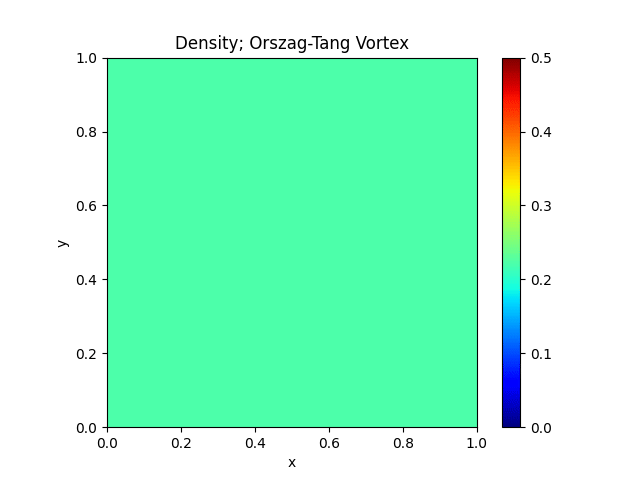

In [6]:
Image(filename='orszag_tang_animation.gif')

## Slice

Text(0, 0.5, 'Pressure')

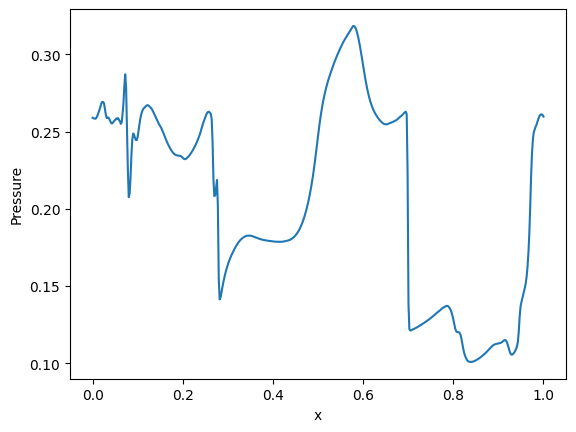

In [7]:
# plot the pressure at y = 0.4277
y = jnp.linspace(0, 1, num_cells)
x = jnp.linspace(0, 1, num_cells)
# find the index closest to 0.4277
y_index = jnp.argmin(jnp.abs(y - 0.3125))

plt.plot(x, final_state[0, :, y_index], label = "Pressure")

plt.xlabel("x")
plt.ylabel("Pressure")